In [315]:
from collections import deque
import sys
import math
import numpy as np
from collections import defaultdict
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore", category=Warning)
import gym
import matplotlib.pyplot as plt
import base64
import IPython
from IPython import display
import time
import imageio

In [316]:
def embed_mp4(filename):
  """Embeds an mp4 file in the notebook."""
  video = open(filename,'rb').read()
  b64 = base64.b64encode(video)
  tag = '''
  <video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{0}" type="video/mp4">
  Your browser does not support the video tag.
  </video>'''.format(b64.decode())

  return IPython.display.HTML(tag)


def test_policy(filename, agent, env, buffer_size = 100, fps=5):
    
    memory = deque(maxlen=buffer_size)
    filename = filename + ".mp4"
    done_cnt = 0
    state = env.reset()
    avg_rewards = []
    ep_reward = 0
    with imageio.get_writer(filename, fps=fps) as video:
        for j in tqdm(range(4000)):
            action = agent.policy_step(state)
            video.append_data(env.render(mode='rgb_array'))
            state, reward, done, _ = env.step(action)
            ep_reward += reward
            if done:
                state = env.reset()
                video.append_data(env.render(mode='rgb_array'))
                done_cnt += 1
                memory.append(ep_reward)
                
                if len(memory) == buffer_size:
                    avg_rewards.append(np.mean(memory))
                ep_reward = 0
                if done_cnt == 200:
                  break

        env.close()
    if len(avg_rewards) > 0:
        return embed_mp4(filename), np.max(avg_rewards), done_cnt
    else:
        return embed_mp4(filename), avg_rewards, done_cnt

In [317]:
class Agent:

    def __init__(self, n_actions, alpha, discount, is_const_epsilon, kind, epsilon = 0.2):
        self.n_actions = n_actions
        self.q_table = defaultdict(lambda: np.zeros(self.n_actions))
        self.episode_idx = 1
        self.alpha = alpha
        self.discount_rate = discount
        self.is_const_epsilon = is_const_epsilon
        self.epsilon = epsilon
        self.kind = kind

    def policy_step(self, state):

        if not self.is_const_epsilon:
          epsilon = 1.0 / self.episode_idx
        else:
          epsilon = self.epsilon

        state_proba = (epsilon / self.n_actions) * np.ones(self.n_actions)

        greedy_action = np.argmax(self.q_table[state])
        state_proba[greedy_action] = (1 - epsilon) + (epsilon / self.n_actions)

        action = np.random.choice(self.n_actions, p=state_proba)

        return action
    
    def sarsa_step(self, state, action, reward, next_state, done):
        
        next_action = self.policy_step(next_state)
        
        err = (reward + (self.discount_rate * self.q_table[next_state][next_action]) - self.q_table[state][action])
        self.q_table[state][action] += (self.alpha * err)
        
        if done:
            self.episode_idx += 1
        
        return next_action
        
    def step_q_learning(self, state, action, reward, next_state, done):

        greedy_action = np.argmax(self.q_table[next_state])
        greedy_action_value = self.discount_rate * self.q_table[next_state][greedy_action]

        err = reward + greedy_action_value - self.q_table[state][action]

        self.q_table[state][action] += (self.alpha * (err))
        
        action = self.policy_step(next_state)

        if done:
            self.episode_idx += 1
        
        return action
        
    def step(self, state, action, reward, next_state, done):
        
        if self.kind == "q_learning":
            action = self.step_q_learning(state, action, reward, next_state, done)
        elif self.kind == "sarsa":
            action = self.sarsa_step(state, action, reward, next_state, done)
        
        return action

In [318]:
def interact(env, agent, num_episodes=10000):

    ineterval = 100
    total_returns = []
    avg_rewards = []
    for i_episode in range(1, num_episodes+1):

        state = env.reset()
        eposide_return = 0
        action = agent.policy_step(state)
        while True:
            next_state, reward, done, _ = env.step(action)
            action = agent.step(state, action, reward, next_state, done)
            eposide_return += reward

            state = next_state
            if done:
                total_returns.append(eposide_return)
                break

        if i_episode >= 100:
          avg_100 = np.mean(total_returns[i_episode - ineterval:i_episode])
          avg_rewards.append(avg_100)

    return avg_rewards

In [319]:
def eval(avg_rewards, label = "", legend = False):
  print(f"maximum average return {np.max(avg_rewards)} at index {np.argmax(avg_rewards)}")
  print(f"overall avg {np.mean(avg_rewards)}")

  plt.plot(avg_rewards, label = label)
  
  if legend:
      plt.legend()

  return np.max(avg_rewards)

def plot_comp(dict_avg):

  fig, ax = plt.subplots()
  for algo, curve in dict_avg.items():
    plt.plot(curve, label = algo, alpha = 1)

  plt.legend()

In [268]:
env = gym.make('Taxi-v3')
n_actions = env.action_space.n

## q_learning with variable epsilon

  0%|          | 0/5 [00:00<?, ?it/s]

maximum average return 8.6 at index 3608
overall avg 5.548118751275251
maximum average return 8.58 at index 4893
overall avg 5.61968373801265


 20%|██        | 1/5 [00:14<00:57, 14.49s/it]

maximum average return 8.64 at index 1511
overall avg 4.624401142623954
maximum average return 8.66 at index 4684
overall avg 4.145225464190982
maximum average return 8.51 at index 2012
overall avg 3.3793858396245655


 40%|████      | 2/5 [00:31<00:47, 15.89s/it]

maximum average return 8.58 at index 4858
overall avg -1.907790246888389
maximum average return 8.57 at index 4543
overall avg -1.5988614568455417
maximum average return 8.21 at index 3675
overall avg -5.2690899816364


 60%|██████    | 3/5 [00:57<00:40, 20.37s/it]

maximum average return 7.65 at index 4780
overall avg -23.625209140991636
maximum average return 8.44 at index 4581
overall avg -11.19678841052846
maximum average return 7.2 at index 4868
overall avg -21.16144460314222


 80%|████████  | 4/5 [01:36<00:27, 27.95s/it]

maximum average return 3.49 at index 4439
overall avg -58.34419710263211
maximum average return -52.56 at index 4858
overall avg -152.7053274841869
maximum average return -91.94 at index 4532
overall avg -168.17354621505817


100%|██████████| 5/5 [03:43<00:00, 44.76s/it]

maximum average return -163.94 at index 4390
overall avg -194.49361150785552
--------------------------------------
----------  Best algorithm  ----------
--------------------------------------
alpha = 0.5, discount = 0.9, maximum_average = 8.66


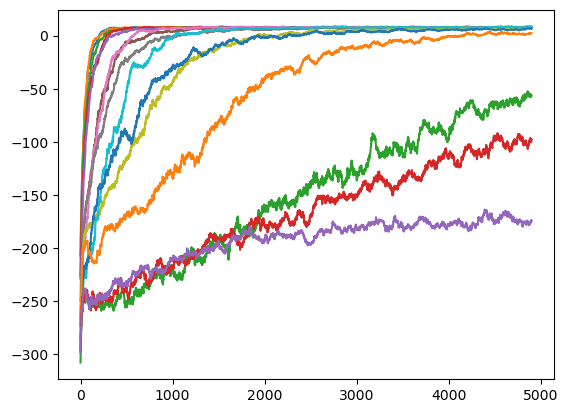

In [298]:
alphas = [0.9, 0.5, 0.2, 0.1, 0.01]
discounts = [0.9, 0.5, 0.1]

max_average_reward = -np.inf
best_algo = ""
for alpha in tqdm(alphas):
    for discount in discounts:
        agent = Agent(n_actions, alpha = alpha, discount = discount, kind = "q_learning", is_const_epsilon = False)
        q_avg_rewards_var_epsilon = interact(env, agent, 5000)

        avg_reward = eval(q_avg_rewards_var_epsilon, label = f"alpha = {alpha}, discount = {discount}", legend = False)
        
        if avg_reward > max_average_reward:
            max_average_reward = avg_reward
            best_algo = f"alpha = {alpha}, discount = {discount}, maximum_average = {max_average_reward}"


print("--------------------------------------")
print("----------  Best algorithm  ----------")
print("--------------------------------------")
print(best_algo)

maximum average return 8.85 at index 3675
overall avg 3.92683125892675


 69%|██████▉   | 2753/4000 [00:18<00:08, 145.08it/s]


7.38 200


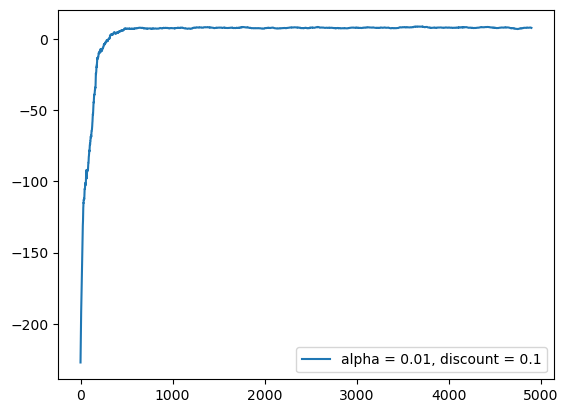

In [299]:
# testing the best algorithm from above
agent = Agent(n_actions, alpha = 0.5, discount = 0.9, kind = "q_learning", is_const_epsilon = False)
q_avg_rewards_var_epsilon = interact(env, agent, 5000)

eval(q_avg_rewards_var_epsilon, label = f"alpha = {alpha}, discount = {discount}", legend = True)

video, max_avg_reward, done_cnt = test_policy("q_learning_var_epsilon", agent, env)

print(max_avg_reward, done_cnt)

video

# q_learning with constant epsilon

  0%|          | 0/5 [00:00<?, ?it/s]

maximum average return 4.76 at index 3199
overall avg -0.45038563558457423
maximum average return 6.42 at index 3394
overall avg 2.771897571924097
maximum average return 8.3 at index 1789
overall avg 5.216925117322995
maximum average return 7.97 at index 4431
overall avg 4.497059783717608
maximum average return 4.67 at index 952
overall avg -0.3341093654356251
maximum average return 6.69 at index 4767
overall avg 2.867767802489288
maximum average return 8.45 at index 2273
overall avg 5.2618384003264635
maximum average return 7.65 at index 1331
overall avg 4.559906141603755
maximum average return 4.36 at index 3737
overall avg -1.523666598653336
maximum average return 6.54 at index 2629
overall avg 1.960040807998368
maximum average return 8.31 at index 4369
overall avg 4.333229953070801


 20%|██        | 1/5 [01:00<04:01, 60.40s/it]

maximum average return 8.03 at index 4889
overall avg 3.74150173433993
maximum average return 4.07 at index 1317
overall avg -2.003899204244032
maximum average return 6.97 at index 2080
overall avg 1.3513425831462968
maximum average return 8.22 at index 1608
overall avg 3.4024341971026315
maximum average return 7.99 at index 4812
overall avg 3.168973678841053
maximum average return 4.75 at index 3919
overall avg -3.2245011222199556
maximum average return 6.69 at index 2455
overall avg 0.24549683738012656
maximum average return 8.26 at index 3585
overall avg 2.93177922872883
maximum average return 7.8 at index 4000
overall avg 2.2137216894511327
maximum average return 4.22 at index 4351
overall avg -10.28911854723526
maximum average return 6.76 at index 3507
overall avg -5.920040807998368
maximum average return 8.17 at index 3077
overall avg -2.417292389308305


 40%|████      | 2/5 [02:11<03:19, 66.62s/it]

maximum average return 7.79 at index 4044
overall avg -3.2781942460722293
maximum average return 4.72 at index 2203
overall avg -7.876788410528463
maximum average return 6.62 at index 2262
overall avg -4.3381697612732095
maximum average return 8.45 at index 3850
overall avg -1.978775760048968
maximum average return 7.79 at index 1878
overall avg -2.6256335441746583
maximum average return 3.54 at index 3890
overall avg -14.366953682921853
maximum average return 6.36 at index 4181
overall avg -9.717992246480309
maximum average return 8.03 at index 4587
overall avg -5.940142827994288
maximum average return 7.57 at index 4759
overall avg -6.814486839420524
maximum average return 2.68 at index 4296
overall avg -38.47075698836972
maximum average return 5.31 at index 4802
overall avg -30.455090797796373
maximum average return 7.16 at index 4887
overall avg -24.54091205876352


 60%|██████    | 3/5 [03:57<02:49, 84.80s/it]

maximum average return 7.11 at index 4895
overall avg -26.22553152417874
maximum average return 4.59 at index 3079
overall avg -19.030483574780657
maximum average return 6.33 at index 4494
overall avg -14.205027545398897
maximum average return 8.72 at index 3624
overall avg -12.09345235666191
maximum average return 8.12 at index 4739
overall avg -12.320561109977557
maximum average return 2.62 at index 4776
overall avg -33.61431952662721
maximum average return 5.08 at index 4858
overall avg -26.65151601713936
maximum average return 6.89 at index 4512
overall avg -22.074819424607224
maximum average return 6.31 at index 4072
overall avg -23.19144052234238
maximum average return -1.83 at index 4839
overall avg -83.47890634564375
maximum average return 0.11 at index 4777
overall avg -70.07516425219343
maximum average return 3.01 at index 4704
overall avg -60.76797388288104


 80%|████████  | 4/5 [06:39<01:55, 115.28s/it]

maximum average return 2.62 at index 4854
overall avg -62.79739849010407
maximum average return -57.22 at index 4807
overall avg -159.84892879004283
maximum average return -59.37 at index 4614
overall avg -155.94540297898388
maximum average return -53.95 at index 4785
overall avg -153.74160783513568
maximum average return -44.82 at index 4900
overall avg -154.69107120995713
maximum average return -122.22 at index 4542
overall avg -195.26591715976332
maximum average return -99.19 at index 4898
overall avg -177.9438420730463
maximum average return -89.79 at index 4890
overall avg -170.1553703325852
maximum average return -94.26 at index 4799
overall avg -171.06965925321362
maximum average return -215.58 at index 4743
overall avg -237.12116914915322
maximum average return -188.32 at index 4304
overall avg -212.70609671495615
maximum average return -169.7 at index 4696
overall avg -196.67976331360947


100%|██████████| 5/5 [15:06<00:00, 181.32s/it]

maximum average return -172.13 at index 4497
overall avg -200.53122628035095
--------------------------------------
----------  Best algorithm  ----------
--------------------------------------
alpha = 0.1, discount = 0.9, epsilon = 0.01, maximum_average = 8.72


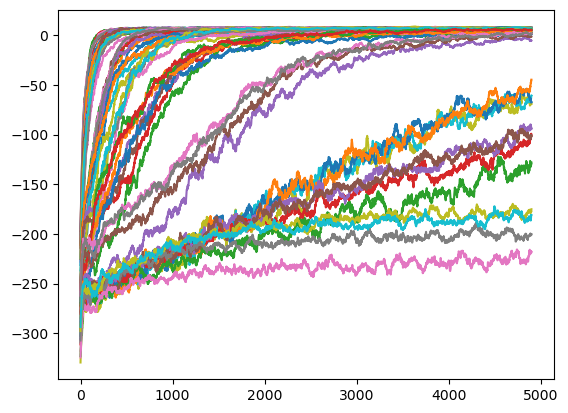

In [293]:
alphas = [0.9, 0.5, 0.2, 0.1, 0.01]
discounts = [0.9, 0.5, 0.1]

max_average_reward = -np.inf
best_algo = ""
for alpha in tqdm(alphas):
    for discount in discounts:
        for epsilon in [0.1, 0.05 , 0.01, 0.02]:
            agent = Agent(n_actions, alpha = alpha, discount = discount, kind = "q_learning", epsilon = epsilon, is_const_epsilon = True)
            q_avg_rewards_const_epsilon = interact(env, agent, 5000)

            avg_reward = eval(q_avg_rewards_const_epsilon, label = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}")

            if avg_reward > max_average_reward:
                max_average_reward = avg_reward
                best_algo = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}, maximum_average = {max_average_reward}"


print("--------------------------------------")
print("----------  Best algorithm  ----------")
print("--------------------------------------")
print(best_algo)

maximum average return 8.26 at index 2592
overall avg -11.815513160579469


 67%|██████▋   | 2694/4000 [00:19<00:09, 141.12it/s]


7.37 200


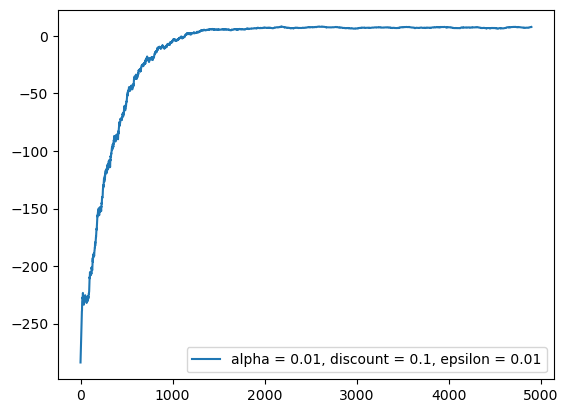

In [346]:
agent = Agent(n_actions, alpha = 0.1, discount = 0.9, kind = "q_learning", epsilon = 0.01, is_const_epsilon = True)
q_avg_rewards_const_epsilon = interact(env, agent, 5000)

eval(q_avg_rewards_const_epsilon, label = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}", legend = True)

video, max_avg_reward, done_cnt = test_policy("q_learning_const_epsilon", agent, env)

print(max_avg_reward, done_cnt)

video

In [ ]:
eval(q_avg_rewards_const_epsilon, label = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}", legend = False)

## Sarsa with variable epsilon

  0%|          | 0/5 [00:00<?, ?it/s]

maximum average return 6.53 at index 1138
overall avg 0.6147969802081209
maximum average return -2.77 at index 455
overall avg -96.11590695776373


 20%|██        | 1/5 [01:01<04:06, 61.55s/it]

maximum average return -44.05 at index 794
overall avg -95.07095286676189
maximum average return 8.24 at index 1036
overall avg 3.2392226076310964
maximum average return -25.05 at index 1662
overall avg -50.2435074474597


 40%|████      | 2/5 [01:49<02:41, 53.81s/it]

maximum average return -32.5 at index 3280
overall avg -85.16239134870435
maximum average return 8.47 at index 3645
overall avg -2.1484962252601507
maximum average return 8.4 at index 4246
overall avg -6.3758783921648625


 60%|██████    | 3/5 [02:26<01:32, 46.01s/it]

maximum average return -25.56 at index 3633
overall avg -72.71935319322587
maximum average return 8.43 at index 4751
overall avg -12.282905529483779
maximum average return 6.98 at index 4656
overall avg -23.913262599469494


 80%|████████  | 4/5 [03:10<00:45, 45.03s/it]

maximum average return -10.52 at index 3321
overall avg -78.0167476025301
maximum average return -49.39 at index 4886
overall avg -153.65257906549684
maximum average return -86.78 at index 4869
overall avg -168.79947153642112


100%|██████████| 5/5 [05:11<00:00, 62.34s/it]

maximum average return -162.23 at index 4761
overall avg -193.1255927361763
--------------------------------------
----------  Best algorithm  ----------
--------------------------------------
alpha = 0.2, discount = 0.9, maximum_average = 8.47


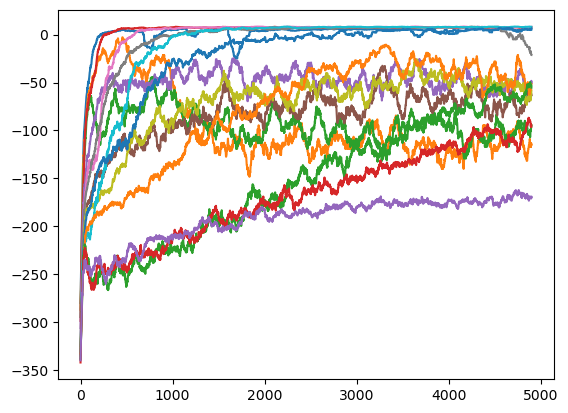

In [321]:
alphas = [0.9, 0.5, 0.2, 0.1, 0.01]
discounts = [0.9, 0.5, 0.1]

max_average_reward = -np.inf
best_algo = ""
for alpha in tqdm(alphas):
    for discount in discounts:
        agent = Agent(n_actions, alpha = alpha, discount = discount, kind = "sarsa", is_const_epsilon = False)
        sarsa_rewards_var_epsilon = interact(env, agent, 5000)

        avg_reward = eval(sarsa_rewards_var_epsilon, label = f"alpha = {alpha}, discount = {discount}", legend = False)
        
        if avg_reward > max_average_reward:
            max_average_reward = avg_reward
            best_algo = f"alpha = {alpha}, discount = {discount}, maximum_average = {max_average_reward}"


print("--------------------------------------")
print("----------  Best algorithm  ----------")
print("--------------------------------------")
print(best_algo)

maximum average return 8.65 at index 3776
overall avg -2.1517465823301367


 65%|██████▌   | 2615/4000 [00:18<00:09, 142.95it/s]


7.96 200


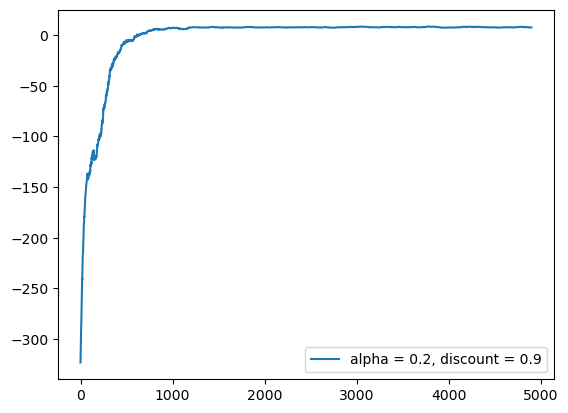

In [323]:
agent = Agent(n_actions, alpha = 0.2, discount = 0.9, kind = "sarsa", is_const_epsilon = False)
sarsa_rewards_var_epsilon = interact(env, agent, 5000)

avg_reward = eval(sarsa_rewards_var_epsilon, label = f"alpha = {0.2}, discount = {0.9}", legend = True)

video, max_avg_reward, done_cnt = test_policy("sarsa_var_epsilon", agent, env)

print(max_avg_reward, done_cnt)

video

## Sarsa with const

  0%|          | 0/5 [00:00<?, ?it/s]

maximum average return -83.21 at index 4734
overall avg -146.18182207712715
maximum average return -79.18 at index 2921
overall avg -120.92866149765354
maximum average return 1.24 at index 414
overall avg -57.81686186492553
maximum average return -142.4 at index 1749
overall avg -199.52071822077127
maximum average return -128.32 at index 4866
overall avg -189.20227912670885
maximum average return -26.76 at index 195
overall avg -151.3620281575189
maximum average return -159.11 at index 3134
overall avg -222.1767149561314
maximum average return -114.56 at index 156
overall avg -182.74322587227098


 20%|██        | 1/5 [05:41<22:44, 341.03s/it]

maximum average return -75.62 at index 151
overall avg -158.29022240359112
maximum average return -0.56 at index 4350
overall avg -21.931201795551928
maximum average return 4.05 at index 4759
overall avg -9.047200571311976
maximum average return 7.95 at index 3493
overall avg 2.8183758416649662
maximum average return -96.81 at index 2370
overall avg -188.67676392572943
maximum average return -56.8 at index 2388
overall avg -143.85550703937975
maximum average return -15.17 at index 408
overall avg -122.94519077739234
maximum average return -161.32 at index 2295
overall avg -211.07717404611304
maximum average return -110.72 at index 2947
overall avg -182.24788206488472


 40%|████      | 2/5 [10:05<14:48, 296.02s/it]

maximum average return -109.03 at index 299
overall avg -168.388900224444
maximum average return 3.06 at index 1804
overall avg -12.756359926545603
maximum average return 6.42 at index 4236
overall avg -6.466104876555806
maximum average return 8.27 at index 2740
overall avg -2.9036339522546424
maximum average return -75.43 at index 3452
overall avg -139.89409916343604
maximum average return -41.45 at index 2548
overall avg -100.34459294021627
maximum average return -14.26 at index 723
overall avg -73.9353050397878
maximum average return -127.61 at index 3391
overall avg -187.06502142419913
maximum average return -123.21 at index 4215
overall avg -177.69996123240156


 60%|██████    | 3/5 [13:49<08:46, 263.26s/it]

maximum average return -84.65 at index 761
overall avg -146.62709447051625
maximum average return 3.63 at index 4029
overall avg -22.558467659661297
maximum average return 6.56 at index 4853
overall avg -16.104478677820854
maximum average return 8.14 at index 4552
overall avg -12.652999387880026
maximum average return -57.64 at index 3456
overall avg -124.62232401550705
maximum average return -6.26 at index 3139
overall avg -83.58382574984697
maximum average return -3.62 at index 3702
overall avg -51.949763313609466
maximum average return -96.72 at index 1872
overall avg -179.67151601713937
maximum average return -101.67 at index 3551
overall avg -157.77637624974494


 80%|████████  | 4/5 [17:19<04:02, 242.27s/it]

maximum average return -79.04 at index 2830
overall avg -137.27130993674763
maximum average return -66.97 at index 4857
overall avg -164.2658477861661
maximum average return -55.62 at index 4858
overall avg -157.96528055498877
maximum average return -54.24 at index 4882
overall avg -155.17202611711895
maximum average return -94.71 at index 4753
overall avg -191.15800040808
maximum average return -99.92 at index 4793
overall avg -178.13914711283408
maximum average return -91.73 at index 4864
overall avg -169.0528524790859
maximum average return -166.75 at index 4852
overall avg -231.44640073454397
maximum average return -176.68 at index 4835
overall avg -210.3554825545807


100%|██████████| 5/5 [23:26<00:00, 281.39s/it]

maximum average return -167.66 at index 4720
overall avg -196.62246888390126
--------------------------------------
----------  Best algorithm  ----------
--------------------------------------
alpha = 0.2, discount = 0.9, epsilon = 0.01, maximum_average = 8.27


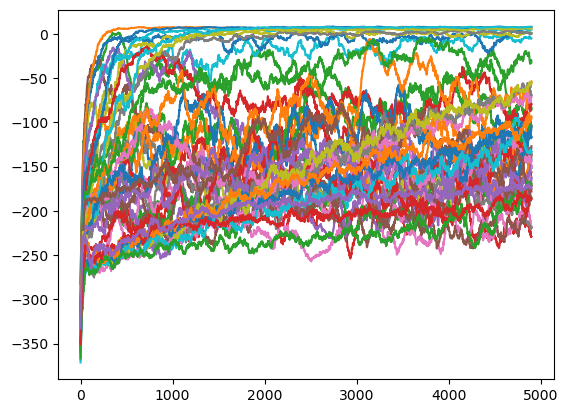

In [345]:
alphas = [0.9, 0.5, 0.2, 0.1, 0.01]
discounts = [0.9, 0.5, 0.1]

max_average_reward = -np.inf
best_algo = ""
for alpha in tqdm(alphas):
    for discount in discounts:
        for epsilon in [0.1, 0.05 , 0.01]:
            agent = Agent(n_actions, alpha = alpha, discount = discount, kind = "sarsa", epsilon = epsilon, is_const_epsilon = True)
            sarsa_rewards_const_epsilon = interact(env, agent, 5000)

            avg_reward = eval(sarsa_rewards_const_epsilon, label = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}", legend = False)

            if avg_reward > max_average_reward:
                max_average_reward = avg_reward
                best_algo = f"alpha = {alpha}, discount = {discount}, epsilon = {epsilon}, maximum_average = {max_average_reward}"


print("--------------------------------------")
print("----------  Best algorithm  ----------")
print("--------------------------------------")
print(best_algo)

maximum average return 8.28 at index 4714
overall avg -2.8367455621301767


 67%|██████▋   | 2690/4000 [00:18<00:09, 143.74it/s]


7.61 200


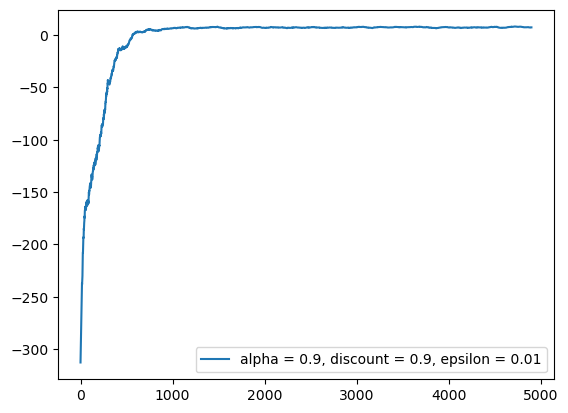

In [327]:
agent = Agent(n_actions, alpha = 0.2, discount = 0.9, epsilon = 0.01, kind = "sarsa", is_const_epsilon = True)
sarsa_rewards_const_epsilon = interact(env, agent, 5000)

avg_reward = eval(sarsa_rewards_const_epsilon, label = f"alpha = {0.9}, discount = {0.9}, epsilon = {epsilon}", legend = True)

video, max_avg_reward, done_cnt = test_policy("sarsa_const_epsilon", agent, env)

print(max_avg_reward, done_cnt)

video

In [129]:
from collections import deque
import sys
import math
import numpy as np
from collections import defaultdict
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore", category=Warning)
import gym
import matplotlib.pyplot as plt

env = gym.make('Taxi-v3')
n_actions = env.action_space.n

In [148]:
state = env.reset()
n_actions = env.action_space.n
observation_space = len([state])

print(f"observation_space = {observation_space}, actions count = {n_actions}")
agent = Agent(observation_space=observation_space, action_size=n_actions, seed=0)

state_size = 1, actions count = 6


In [ ]:
import matplotlib.pyplot as plt
from IPython import display
import time

# DQN Implementation

Citing:
- https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html
- https://www.tensorflow.org/agents/tutorials/1_dqn_tutorial#:~:text=The%EE%80%80%20algorithm%20used%20to%20solve%20an%20RL%20problem
- https://colab.research.google.com/drive/1ijRjrrsZ1nTMcb8M-lDz5ozvpvK_wpRP

Those three resources helped us in making the following implementation after adapting changes

In [347]:
import numpy as np
import random
from collections import namedtuple, deque

import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn

from collections import deque
import sys
import math
import numpy as np
from collections import defaultdict
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore", category=Warning)
import gym
import matplotlib.pyplot as plt

env = gym.make('Taxi-v3')
n_actions = env.action_space.n

In [348]:
import gym
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import random
import matplotlib.pyplot as plt

In [349]:
class ReplayBuffer:
    """buffer to store the following outcomes for each transition ("state", "action", "reward", "next_state", "done")"""

    def __init__(self, action_size, buffer_size, batch_size):
        """
        action_size: number of actions in the environment
        buffer_size: the desired size of the memory buffer after which the memory drops older values
        batch_size: the number of elements to consider
        """
        self.action_size = action_size
        self.memory = deque(maxlen=buffer_size)
        self.batch_size = batch_size
        self.transition = namedtuple("Transitions", field_names=["state", "action", "reward", "next_state", "done"])

    def push(self, state, action, reward, next_state, done):
        """pushing new transition to the memory"""
        e = self.transition(state, action, reward, next_state, done)
        self.memory.append(e)

    def sample(self):
        """sample a batch of transitions randomly from the memory"""
        transition = random.sample(self.memory, k=self.batch_size)
        
        states, actions, rewards, next_states, dones = zip(*transition)
        
        states = torch.tensor(states, dtype=torch.long).to(device)
        actions = torch.tensor(actions, dtype=torch.long).unsqueeze(1).to(device)
        rewards = torch.tensor(rewards, dtype=torch.float32).unsqueeze(1).to(device)
        next_states = torch.tensor(next_states, dtype=torch.long).to(device)
        dones = torch.tensor(dones, dtype=torch.float32).unsqueeze(1).to(device)
        
        return states, actions, rewards, next_states, dones

    def __len__(self):
        """return the curent length of the buffer"""
        return len(self.memory)

In [350]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class DQN(nn.Module):
    def __init__(self, observation_space, action_space, alpha, hidden_size):
        super(DQN, self).__init__()
        self.embedding = nn.Embedding(observation_space, 10)
        
        self.fc1 = nn.Linear(10, hidden_size[0])
        self.fc2 = nn.Linear(hidden_size[0], hidden_size[1])
        self.fc3 = nn.Linear(hidden_size[1], hidden_size[2])
        self.fc4 = nn.Linear(hidden_size[2], action_space)

    def forward(self, x):
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x).long()
        x = self.embedding(x)
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = F.leaky_relu(self.fc3(x))
        x = self.fc4(x)
        return x

In [351]:
class DQNAgent:
    def __init__(self,
                 observation_space,
                 action_size,
                 gamma=0.99,
                 lr=0.001,
                 epsilon=1.0,
                 decay_rate=0.999,
                 min_epsilon=0.05,
                 buffer_size=10000,
                 batch_size=128,
                 hidden_sizes = None):
        
        self.observation_space = observation_space
        self.action_size = action_size
        self.gamma = gamma
        self.epsilon = epsilon
        self.decay_rate = decay_rate
        self.min_epsilon = min_epsilon
        self.batch_size = batch_size
        
        if hidden_sizes == None:
            hidden_sizes = [50, 50, 50]
        
        # initializing the policy and targt networks that will be used
        self.policy_network = DQN(observation_space, action_size, lr, hidden_sizes).to(device)
        self.target_network = DQN(observation_space, action_size, lr, hidden_sizes).to(device)
        
        # copy parameters and buffer from the policy network to the target network
        self.target_network.load_state_dict(self.policy_network.state_dict())
        
        # initialize Adam optimizer
        self.optimizer = optim.Adam(self.policy_network.parameters(), lr=lr, amsgrad=True)
        self.memory = ReplayBuffer(action_size, buffer_size, batch_size)
        self.step_counter = 0
        self.target_update_frequency = 20  # Update target network more frequently

    def select_action(self, state, deterministic=False):
        """choose an action according to epsilon greedy policy"""
        
        if random.random() < self.epsilon and not deterministic:
            return np.random.randint(self.action_size)
        else:
            with torch.no_grad():
                state_tensor = torch.tensor([state], dtype=torch.long).to(device)
                action_vec = self.policy_network(state_tensor)
                return torch.argmax(action_vec).item()

    def update(self, state, action, reward, next_state, done, tau = 0.005):
        """use experimence replay and soft update the policy"""
        self.memory.push(state, action, reward, next_state, done)

        if self.memory.__len__() >= self.batch_size:
            self.replay(self.batch_size)

        self.step_counter += 1
        
        # soft update of the target policy
        target_net_state_dict = self.target_network.state_dict()
        policy_net_state_dict = self.policy_network.state_dict()

        for key in policy_net_state_dict:
            target_net_state_dict[key] = policy_net_state_dict[key]*tau + target_net_state_dict[key]*(1-tau)

        self.target_network.load_state_dict(target_net_state_dict)
            
    def replay(self, batch_size):
        """network optimization from experience replay"""
        states, actions, rewards, next_states, dones = self.memory.sample()

        current_q_values = self.policy_network(states).gather(1, actions)
        next_q_values = self.target_network(next_states).max(1)[0].unsqueeze(1)
        expected_q_values = rewards + (1 - dones) * self.gamma * next_q_values

        loss = F.mse_loss(current_q_values, expected_q_values.detach())
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_epsilon(self):
        eps = self.epsilon * self.decay_rate
        self.epsilon = max(eps, self.min_epsilon)

In [352]:
env = gym.make('Taxi-v3')
observation_space = env.observation_space.n
action_size = env.action_space.n


def interact_dqn(**args):
    agent = DQNAgent(observation_space, action_size, **args)

    num_episodes = 10000
    ep_display = 100

    ep_rewards = []
    total_returns = deque(maxlen=100)
    
    ineterval = 100
    avg_rewards = []
    
    for episode in range(num_episodes):
        episode_reward = 0
        state = env.reset()

        while True:
            action = agent.select_action(state)
            next_state, reward, done, truncated = env.step(action)
            agent.update(state, action, reward, next_state, done)
            state = next_state
            episode_reward += reward
            
            if done:
                total_returns.append(episode_reward)
                break

        agent.update_epsilon()
        ep_rewards.append(episode_reward)
        
        print('\rEpisode {}\tAverage Score: {:.2f}'.format(episode, np.mean(total_returns)), end="")
        
        if episode >= 100:
          avg_100 = np.mean(total_returns)
          avg_rewards.append(avg_100)
    return agent, avg_rewards

#env.close()

In [353]:
hidden_sizes = [50, 50, 50]
args ={"lr":0.001, "gamma":0.95, "epsilon":1.0, "decay_rate":0.995, "min_epsilon":0.01, "buffer_size":10000, "batch_size":128, "hidden_sizes":hidden_sizes}
agent, dqn_avg_rewards = interact_dqn(**args)

Episode 9999	Average Score: 7.0775

maximum average return 8.2 at index 7380
overall avg -0.40499191919191735


Text(0.5, 1.0, 'Average Rewards Over Episodes')

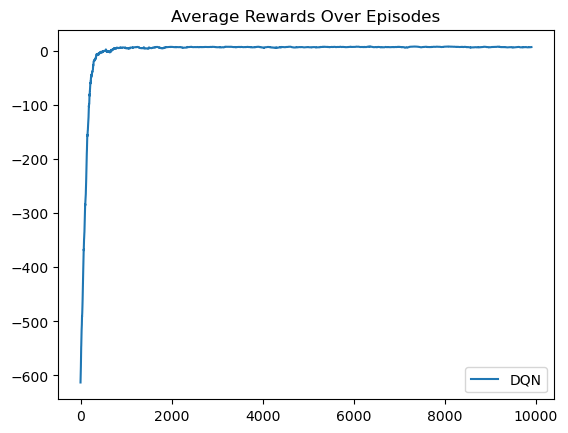

In [354]:
eval(dqn_avg_rewards, label = "DQN", legend = True)
plt.title("Average Rewards Over Episodes")

In [356]:
def test_policy_dqn(filename, agent, env, buffer_size = 100, fps=5):
    
    memory = deque(maxlen=buffer_size)
    filename = filename + ".mp4"
    done_cnt = 0
    state = env.reset()
    avg_rewards = []
    ep_reward = 0
    with imageio.get_writer(filename, fps=fps) as video:
        for j in tqdm(range(4000)):
            action = agent.select_action(state)
            video.append_data(env.render(mode='rgb_array'))
            state, reward, done, _ = env.step(action)
            ep_reward += reward
            if done:
                state = env.reset()
                video.append_data(env.render(mode='rgb_array'))
                done_cnt += 1
                memory.append(ep_reward)
                
                if len(memory) == buffer_size:
                    avg_rewards.append(np.mean(memory))
                ep_reward = 0
                if done_cnt == 200:
                  break

        env.close()
    if len(avg_rewards) > 0:
        return embed_mp4(filename), np.max(avg_rewards), done_cnt
    else:
        return embed_mp4(filename), avg_rewards, done_cnt

In [357]:
video, max_avg_reward, done_cnt = test_policy_dqn("dqn", agent, env)

 68%|██████▊   | 2725/4000 [00:20<00:09, 133.61it/s]


In [362]:
print(max_avg_reward, done_cnt)

video

7.69 200


# Results

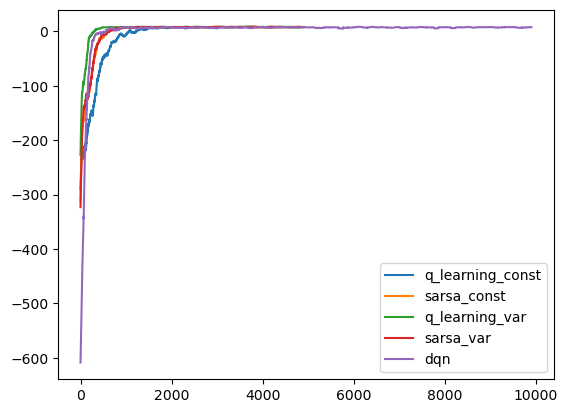

In [341]:
d_items = {"q_learning_const": q_avg_rewards_const_epsilon, "sarsa_const": sarsa_rewards_const_epsilon, "q_learning_var": q_avg_rewards_var_epsilon, "sarsa_var": sarsa_rewards_var_epsilon, "dqn": dqn_avg_rewards}
plot_comp(d_items)

In [ ]:
!pip install ufal.pybox2d